<a href="https://colab.research.google.com/github/dandamudi-geeta/2348512_GeetaPriya/blob/main/2348512_AML(Lab1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [2]:
data=pd.read_csv('/content/data - data.csv')


In [3]:
data.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,02-05-2014 0:00,313000.0,3,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,02-05-2014 0:00,2384000.0,5,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,02-05-2014 0:00,342000.0,3,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,02-05-2014 0:00,420000.0,3,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,02-05-2014 0:00,550000.0,4,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


In [4]:
data.shape

(4600, 18)

In [5]:
data.info

<bound method DataFrame.info of                  date         price  bedrooms  bathrooms  sqft_living  \
0     02-05-2014 0:00  3.130000e+05         3       1.50         1340   
1     02-05-2014 0:00  2.384000e+06         5       2.50         3650   
2     02-05-2014 0:00  3.420000e+05         3       2.00         1930   
3     02-05-2014 0:00  4.200000e+05         3       2.25         2000   
4     02-05-2014 0:00  5.500000e+05         4       2.50         1940   
...               ...           ...       ...        ...          ...   
4595  09-07-2014 0:00  3.081667e+05         3       1.75         1510   
4596  09-07-2014 0:00  5.343333e+05         3       2.50         1460   
4597  09-07-2014 0:00  4.169042e+05         3       2.50         3010   
4598  10-07-2014 0:00  2.034000e+05         4       2.00         2090   
4599  10-07-2014 0:00  2.206000e+05         3       2.50         1490   

      sqft_lot  floors  waterfront  view  condition  sqft_above  \
0         7912     1.5  

In [6]:
data.isnull().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
street           0
city             0
statezip         0
country          0
dtype: int64

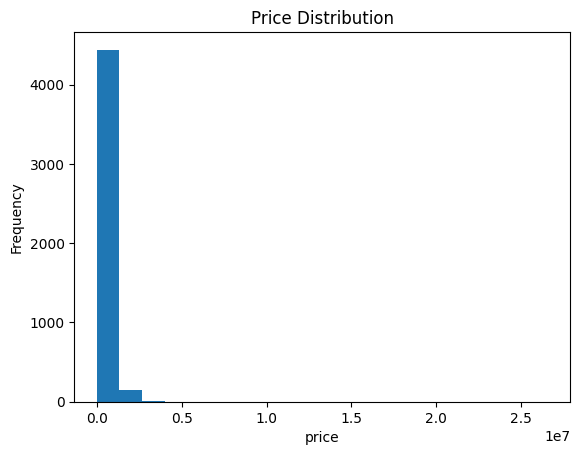

In [8]:
data['price'].plot.hist(bins=20)
plt.title('Price Distribution')
plt.xlabel('price')
plt.show()

<ipython-input-11-89b2a9b2a06b>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix=data.corr()


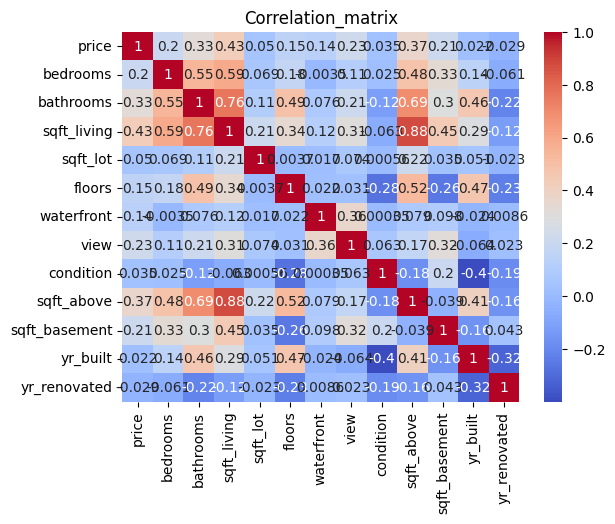

In [11]:
import seaborn as sns


correlation_matrix=data.corr()
sns.heatmap(correlation_matrix, annot= True , cmap='coolwarm')
plt.title('Correlation_matrix')
plt.show()

In [13]:
data.groupby('city')['price'].mean().sort_values(ascending=False).head(10)

city
Medina                2.046559e+06
Clyde Hill            1.321945e+06
Yarrow Point          1.194838e+06
Mercer Island         1.123818e+06
Bellevue              8.471807e+05
Beaux Arts Village    7.450000e+05
Fall City             6.926818e+05
Sammamish             6.869176e+05
Redmond               6.676495e+05
Newcastle             6.660467e+05
Name: price, dtype: float64

In [14]:
# Define the number of bins and bin names for 'Year Built' and 'Sqft_Above'
num_bins = 5
bin_labels = ["Very Old", "Old", "Mid-Age", "Newer", "Very New"]

# Bin 'Year Built'
data['Year Built Bin'] = pd.cut(data['yr_built'], bins=num_bins, labels=bin_labels)

# Bin 'Sqft_Above'
data['Sqft Above Bin'] = pd.cut(data['sqft_above'], bins=num_bins, labels=bin_labels)

# Calculate the mean of 'Year Built' and 'Sqft_Above' for each bin
bin_means_year_built = data.groupby('Year Built Bin')['yr_built'].mean()
bin_means_sqft_above = data.groupby('Sqft Above Bin')['sqft_above'].mean()

# Calculate the bin boundaries
bin_boundaries_year_built = data.groupby('Year Built Bin')['yr_built'].min().tolist() + [data['yr_built'].max()]
bin_boundaries_sqft_above = data.groupby('Sqft Above Bin')['sqft_above'].min().tolist() + [data['sqft_above'].max()]

In [15]:
print("Bin Means for Year Built:")
print(bin_means_year_built)

print("Bin Means for Sqft Above:")
print(bin_means_sqft_above)

print("Bin Boundaries for Year Built:")
print(bin_boundaries_year_built)

print("Bin Boundaries for Sqft Above:")
print(bin_boundaries_sqft_above)

Bin Means for Year Built:
Year Built Bin
Very Old    1911.414062
Old         1934.308271
Mid-Age     1957.737024
Newer       1981.212042
Very New    2003.595514
Name: yr_built, dtype: float64
Bin Means for Sqft Above:
Sqft Above Bin
Very Old    1384.617558
Old         2776.695470
Mid-Age     4408.292453
Newer       6435.714286
Very New    8370.000000
Name: sqft_above, dtype: float64
Bin Boundaries for Year Built:
[1900, 1923, 1946, 1969, 1992, 2014]
Bin Boundaries for Sqft Above:
[370, 2180, 3990, 6050, 7680, 9410]


In [16]:
numerical_columns = data.select_dtypes(include=[np.number]).columns


Normalize the attributes that has numerical values

In [17]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the Min-Max scaler
scaler = MinMaxScaler()

# Apply Min-Max scaling to the numerical columns
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

In [18]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Assuming 'data' is your DataFrame
numerical_columns = data.select_dtypes(include=[np.number]).columns

# Initialize the Min-Max scaler
scaler = MinMaxScaler()

# Apply Min-Max scaling to the numerical columns
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])
data

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country,Year Built Bin,Sqft Above Bin
0,02-05-2014 0:00,0.011771,0.333333,0.18750,0.073652,0.006775,0.2,0.0,0.0,0.50,0.107301,0.000000,0.482456,0.995531,18810 Densmore Ave N,Shoreline,WA 98133,USA,Mid-Age,Very Old
1,02-05-2014 0:00,0.089658,0.555556,0.31250,0.249051,0.007835,0.4,0.0,1.0,1.00,0.331858,0.058091,0.184211,0.000000,709 W Blaine St,Seattle,WA 98119,USA,Very Old,Old
2,02-05-2014 0:00,0.012862,0.333333,0.25000,0.118451,0.010534,0.0,0.0,0.0,0.75,0.172566,0.000000,0.578947,0.000000,26206-26214 143rd Ave SE,Kent,WA 98042,USA,Mid-Age,Very Old
3,02-05-2014 0:00,0.015795,0.333333,0.28125,0.123766,0.006885,0.0,0.0,0.0,0.75,0.069690,0.207469,0.552632,0.000000,857 170th Pl NE,Bellevue,WA 98008,USA,Mid-Age,Very Old
4,02-05-2014 0:00,0.020684,0.444444,0.31250,0.119210,0.009186,0.0,0.0,0.0,0.75,0.085177,0.165975,0.666667,0.989076,9105 170th Ave NE,Redmond,WA 98052,USA,Newer,Very Old
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,09-07-2014 0:00,0.011590,0.333333,0.21875,0.086560,0.005330,0.0,0.0,0.0,0.75,0.126106,0.000000,0.473684,0.982622,501 N 143rd St,Seattle,WA 98133,USA,Mid-Age,Very Old
4596,09-07-2014 0:00,0.020095,0.333333,0.31250,0.082764,0.006460,0.4,0.0,0.0,0.50,0.120575,0.000000,0.728070,0.997517,14855 SE 10th Pl,Bellevue,WA 98007,USA,Newer,Very Old
4597,09-07-2014 0:00,0.015679,0.333333,0.31250,0.200456,0.005939,0.4,0.0,0.0,0.50,0.292035,0.000000,0.956140,0.000000,759 Ilwaco Pl NE,Renton,WA 98059,USA,Very New,Old
4598,10-07-2014 0:00,0.007649,0.444444,0.25000,0.130600,0.005581,0.0,0.0,0.0,0.50,0.077434,0.211618,0.649123,0.000000,5148 S Creston St,Seattle,WA 98178,USA,Newer,Very Old


Visualization

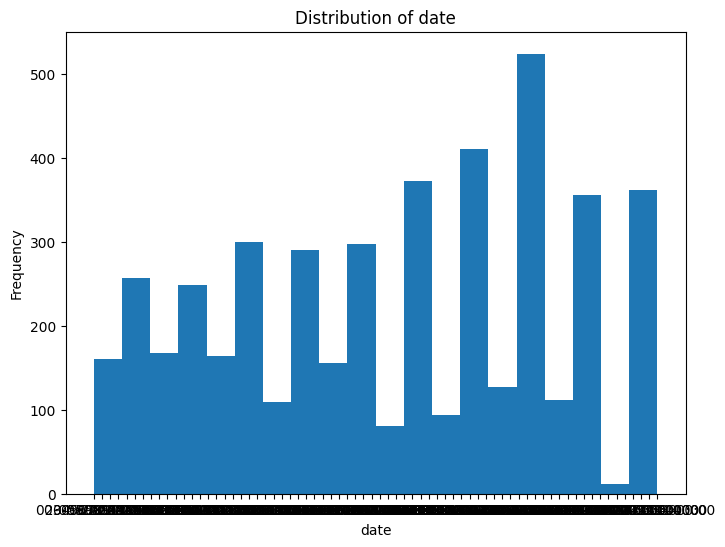

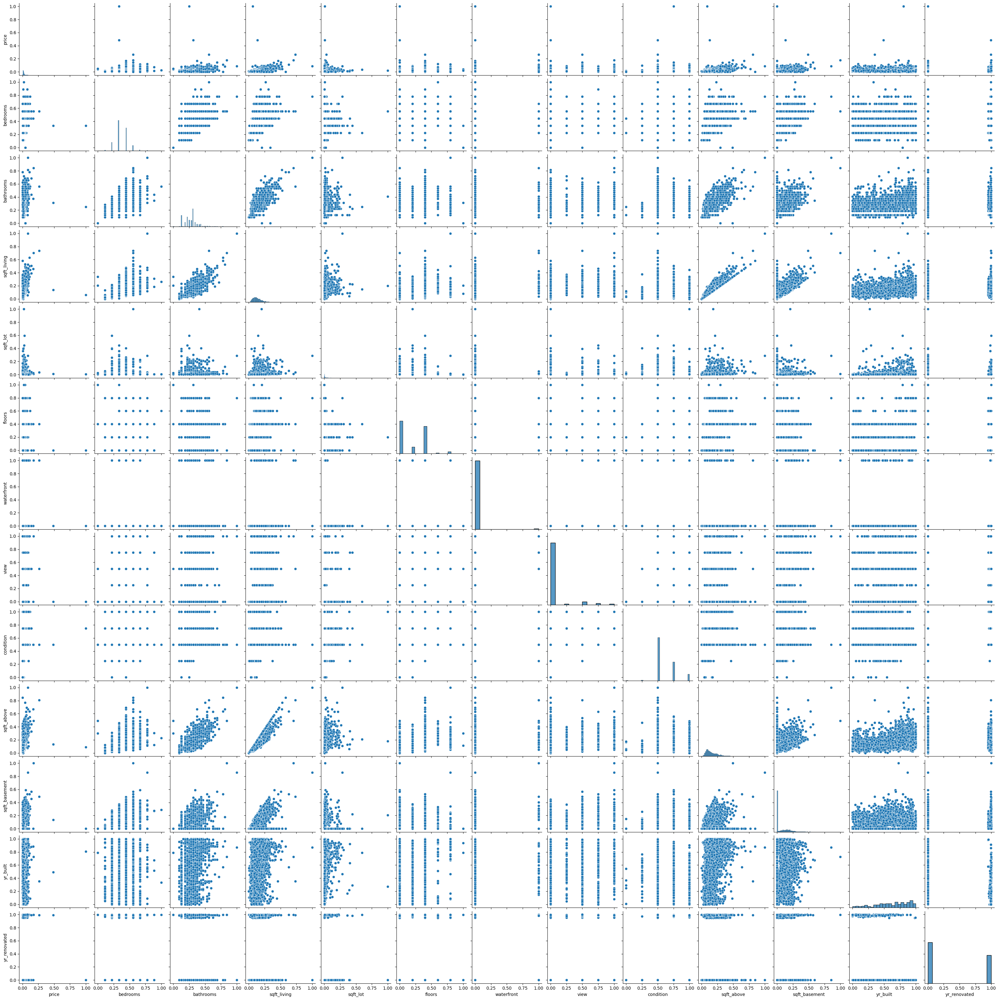

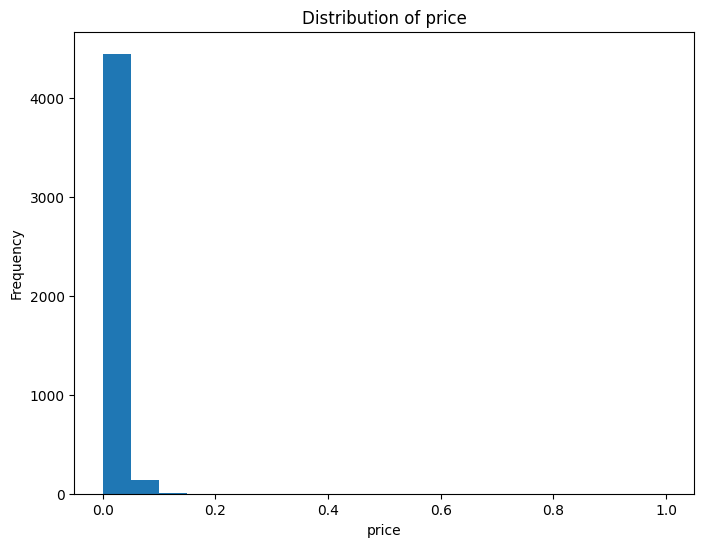

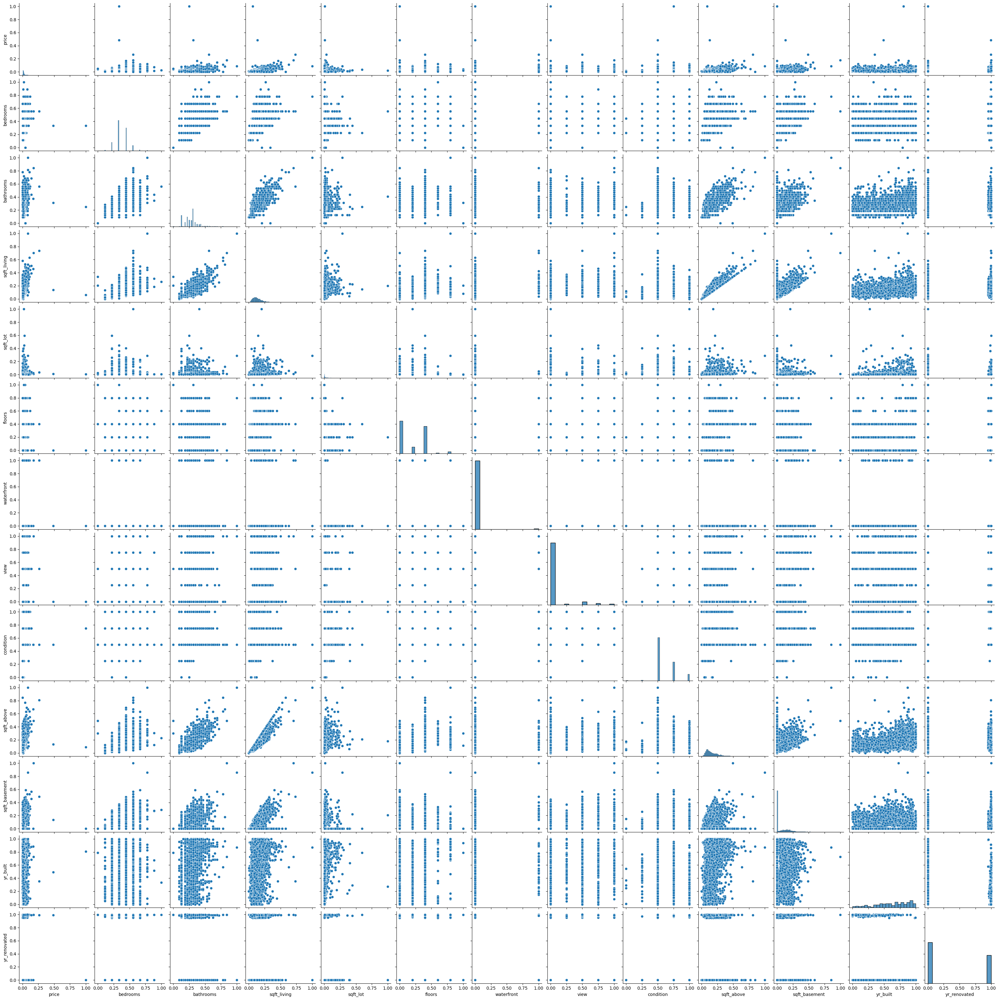

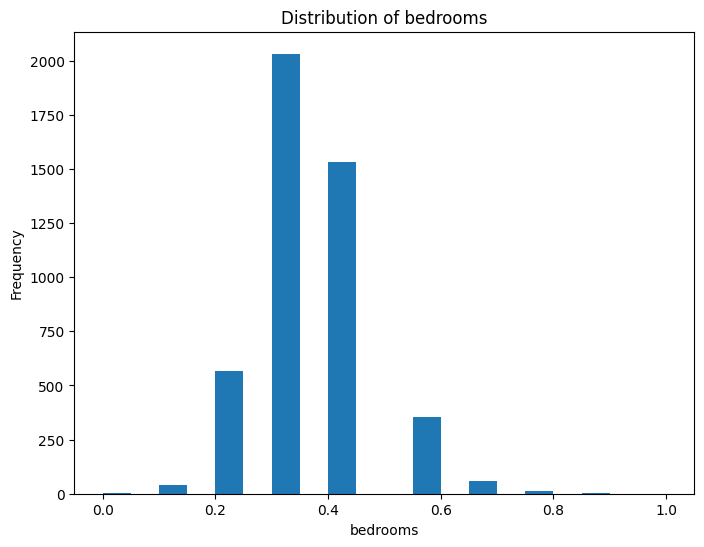

...

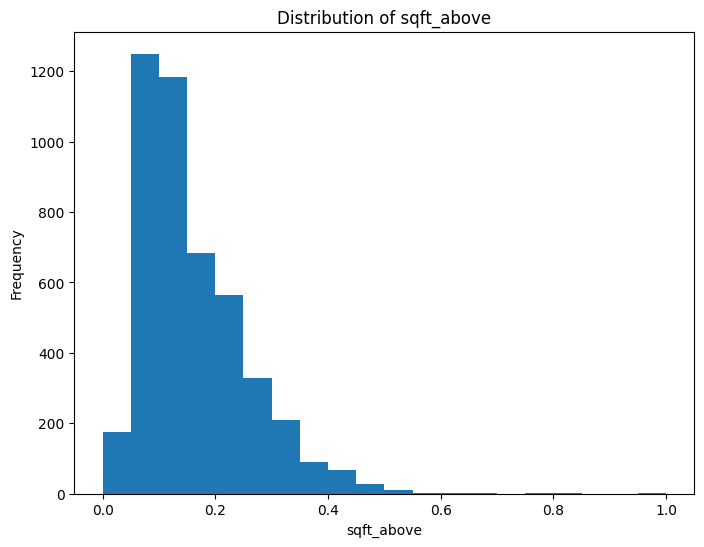

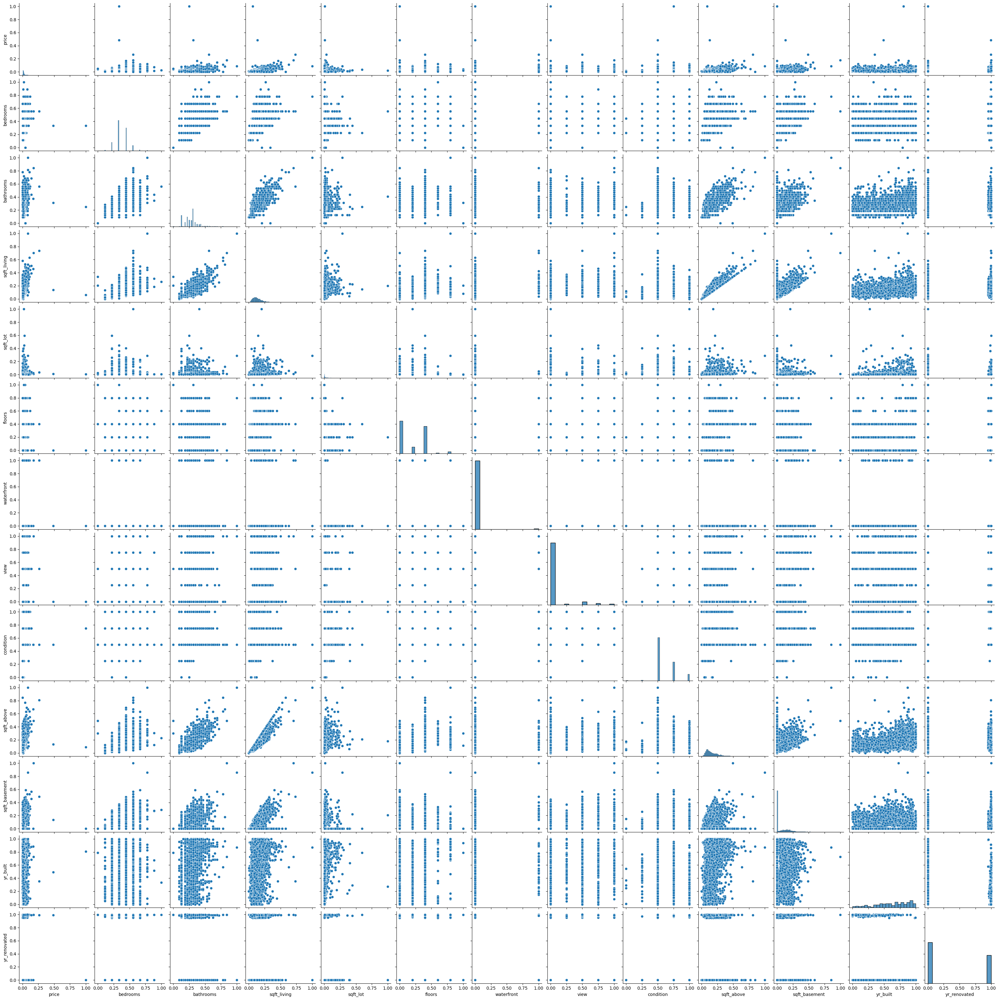

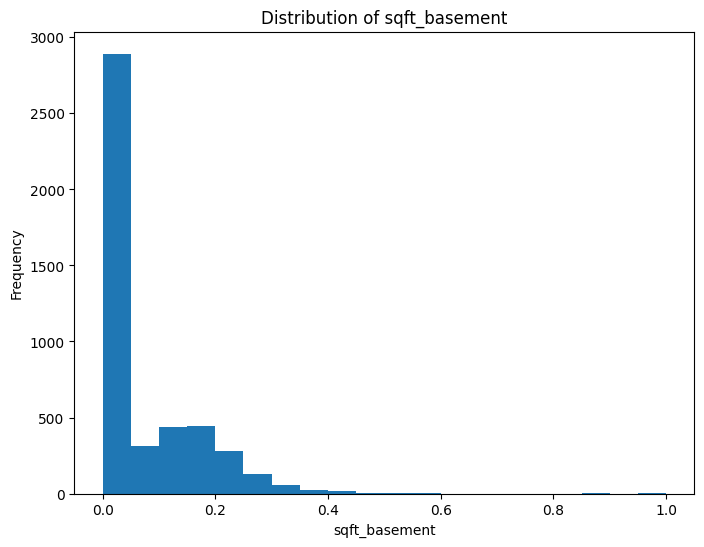

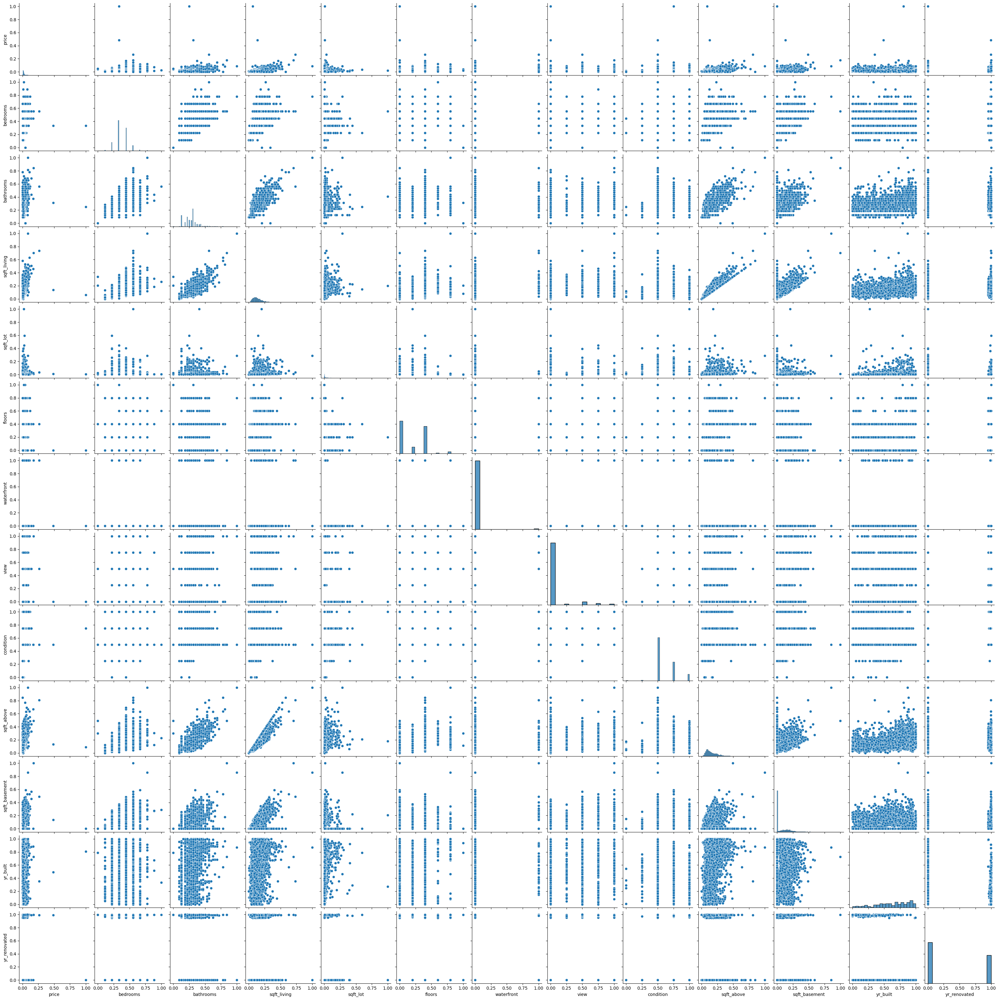

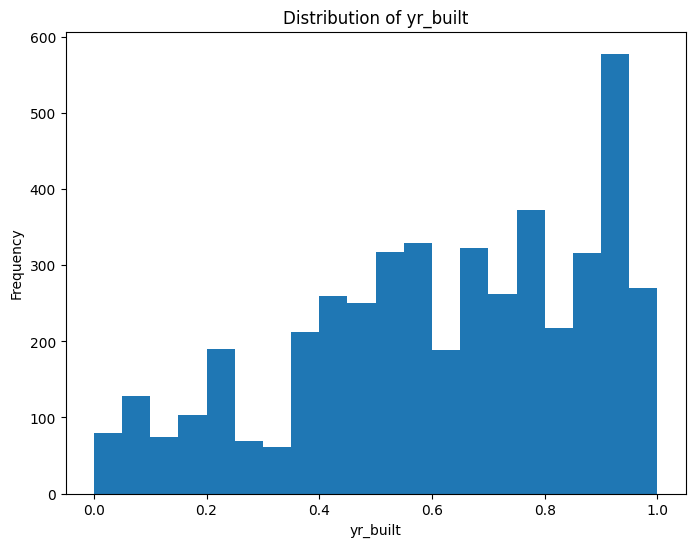

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for column in data.columns:
    plt.figure(figsize=(8, 6))
    plt.hist(data[column], bins=20)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()
    sns.pairplot(data)
    plt.show()

**Inference:**

* The "price" attribute has a right-skewed distribution, indicating the presence of high-value properties.
* The "bedrooms" and "bathrooms" attributes have a strong linear relationship in the pairplot, suggesting that properties with more bedrooms tend to have more bathrooms.
* Outliers in the "sqft_living" attribute may represent very large living areas.
* After normalization, all numerical attributes have been scaled to the [0, 1] range, making it easier to compare them.


Z-score Normalization

In [24]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Select only numerical attributes
numerical_attributes = data.select_dtypes(include=['int64', 'float64'])

# Apply Z-score normalization
scaler = StandardScaler()
normalized_data = pd.DataFrame(scaler.fit_transform(numerical_attributes), columns=numerical_attributes.columns)

# Inferences
original_stats = data.describe()
normalized_stats = normalized_data.describe()

print("Original Data Statistics:")
print(original_stats)

print("\nNormalized Data Statistics:")
print(normalized_stats)


Original Data Statistics:
             price     bedrooms    bathrooms  sqft_living     sqft_lot  \
count  4600.000000  4600.000000  4600.000000  4600.000000  4600.000000   
mean      0.020758     0.377874     0.270102     0.134347     0.013240   
std       0.021205     0.100983     0.097973     0.073136     0.033425   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.012143     0.333333     0.218750     0.082764     0.004064   
50%       0.017335     0.333333     0.281250     0.122248     0.006562   
75%       0.024632     0.444444     0.312500     0.170843     0.009653   
max       1.000000     1.000000     1.000000     1.000000     1.000000   

            floors   waterfront         view    condition   sqft_above  \
count  4600.000000  4600.000000  4600.000000  4600.000000  4600.000000   
mean      0.204826     0.007174     0.060163     0.612935     0.161202   
std       0.215315     0.084404     0.194601     0.169307     0.095373   
min       0

Visualize MinMax Values and Z-Score Values

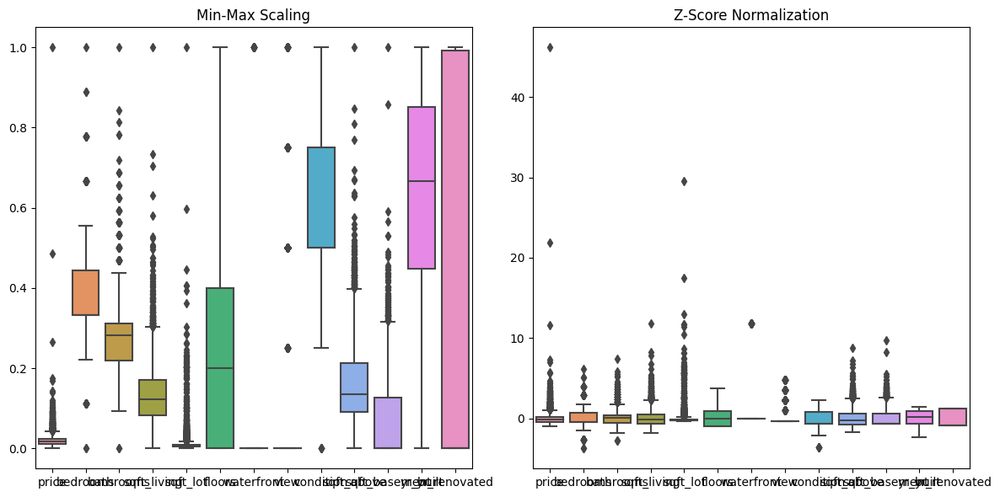

In [23]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Apply Min-Max scaling
min_max_scaler = MinMaxScaler()
min_max_data = pd.DataFrame(min_max_scaler.fit_transform(numerical_attributes), columns=numerical_attributes.columns)

# Apply Z-score normalization
z_score_scaler = StandardScaler()
z_score_data = pd.DataFrame(z_score_scaler.fit_transform(numerical_attributes), columns=numerical_attributes.columns)

# Create side-by-side box plots to visualize Min-Max and Z-Score values
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
sns.boxplot(data=min_max_data, ax=axes[0])
sns.boxplot(data=z_score_data, ax=axes[1])
axes[0].set_title("Min-Max Scaling")
axes[1].set_title("Z-Score Normalization")

plt.tight_layout()
plt.show()

Inference:
By comparing the two plots, you can see how each attribute's distribution changes after applying the two different normalization methods.
Min-Max scaling constrains values to the [0, 1] range but retains the original distribution's shape, while Z-score normalization centers and scales values to have a mean of 0 and a standard deviation of 1.
Z-score normalization tends to be more effective at handling outliers and ensuring that all attributes are on a common scale for algorithms sensitive to variable magnitudes, such as Principal Component Analysis (PCA) or gradient-based optimization algorithms.
